In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import re
import cv2
from matplotlib.patches import Rectangle
import spatialdata as sd

from matplotlib.gridspec import GridSpec
from datetime import datetime
from matplotlib.ticker import FixedLocator, FixedFormatter
import matplotlib
matplotlib.rcParams["text.usetex"] = False
matplotlib.rcParams['pdf.fonttype'] = 42
matplotlib.rcParams['ps.fonttype'] = 42
from matplotlib import rc
rc('font',**{'family':'sans-serif','sans-serif':['DejaVu Sans']})

plt.rcParams['axes.grid'] = False
fontsize = 16
plt.rcParams['xtick.labelsize'] = fontsize
plt.rcParams['ytick.labelsize'] = fontsize
plt.rcParams['axes.labelsize'] = fontsize
plt.rcParams['axes.labelsize'] = fontsize
plt.rcParams['axes.titlesize'] = fontsize

%config InlineBackend.figure_format='retina' 

In [ ]:
import importlib.util
import sys
def lazy_import(module_name, path_to_file):
    spec = importlib.util.spec_from_file_location(module_name,path_to_file)
    foo = importlib.util.module_from_spec(spec)
    sys.modules[module_name] = foo
    spec.loader.exec_module(foo)
    return foo

utils_dir = "../../utils"
general_utils =  lazy_import("general_utils",os.path.join(utils_dir, "general_utils.py"))
imaging_utils =  lazy_import("imaging_utils",os.path.join(utils_dir, "imaging_utils.py"))
from general_utils import ismember, grep, grep_exclude
from imaging_utils import imnormalize, im2rgb, imblend, imoverlay, rolling_ball_filter


In [ ]:
def get_image_slice(sdata, key, scale, channel, row_slice, col_slice):
    channels = np.array(sd.models.get_channel_names(sdata.images[key])).tolist()
    idx = channels.index(channel)
    return sdata.images[key][scale].image[idx][row_slice, col_slice].compute().values    


In [ ]:
df = pd.read_csv("CellDive_progenitor_niche__premalignant_annotated.csv.gz")

In [ ]:
selected_slide = 'SLIDE-0289'
df_sub = df.loc[df['slide_id'] == selected_slide,:].copy()

In [ ]:
sdata = sd.read_zarr(os.path.join("sdata", selected_slide))

version mismatch: detected: RasterFormatV02, requested: FormatV04
/data1/lowes/reyesj3/miniconda3/envs/sopa/lib/python3.12/site-packages/zarr/creation.py:610: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)
/data1/lowes/reyesj3/miniconda3/envs/sopa/lib/python3.12/site-packages/zarr/creation.py:610: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)
/data1/lowes/reyesj3/miniconda3/envs/sopa/lib/python3.12/site-packages/zarr/creation.py:610: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)
/data1/lowes/reyesj3/miniconda3/envs/sopa/lib/python3.12/site-packages/zarr/creation.py:610: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)
/data1/lowes/reyesj3/miniconda3/envs/sopa/lib/python3.12/site-

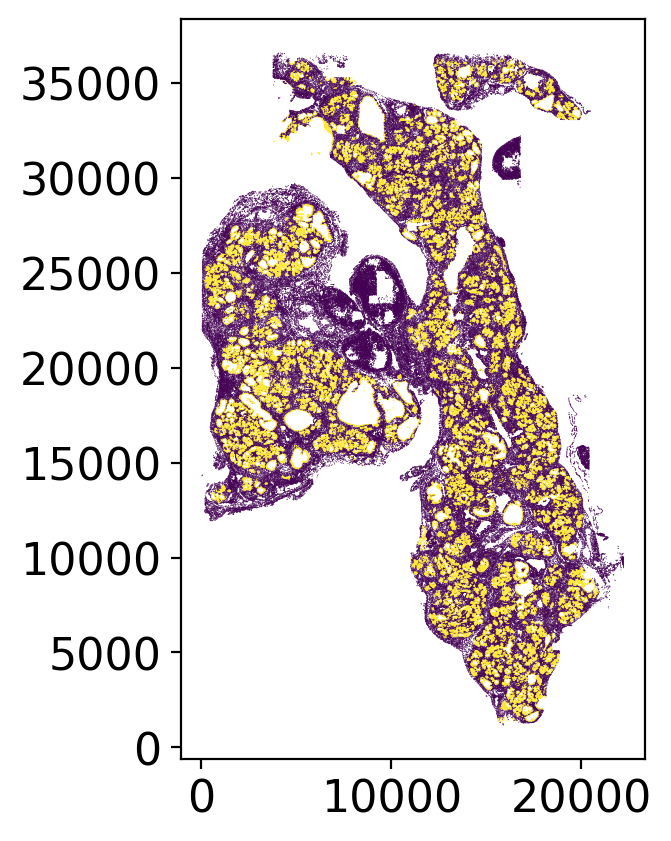

In [ ]:
plt.scatter(df_sub['centroid_col'], df_sub['centroid_row'], c = df_sub['GFP_positive'], s = 0.1, edgecolor='none')
plt.gca().set_aspect('equal', adjustable='box')


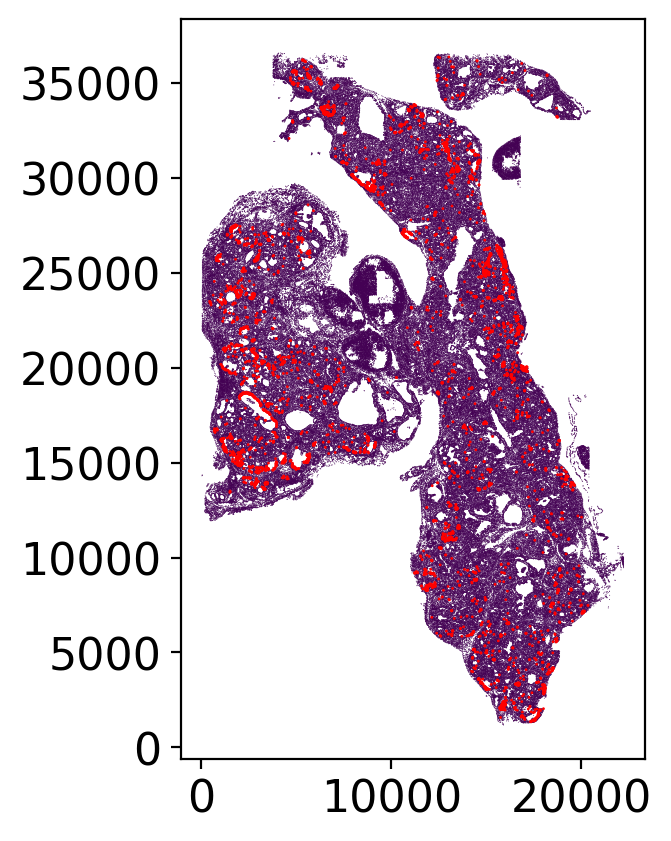

In [ ]:
plt.scatter(df_sub['centroid_col'], df_sub['centroid_row'], c = df_sub['HMGA2_positive'], s = 0.1, edgecolor='none')
plt.scatter(df_sub['centroid_col'][df_sub['HMGA2_positive']], df_sub['centroid_row'][df_sub['HMGA2_positive']], c = 'red', s = 1, edgecolor='none')
plt.gca().set_aspect('equal', adjustable='box')


In [ ]:
df_sub.columns

Index(['Unnamed: 0', 'DAPI_cyto_mean_intensity', 'DAPI_cyto_total_intensity',
       'DAPI_nucleus_mean_intensity', 'DAPI_nucleus_total_intensity',
       'HMGA2_cyto_mean_intensity', 'HMGA2_cyto_total_intensity',
       'HMGA2_nucleus_mean_intensity', 'HMGA2_nucleus_total_intensity',
       'PanCK_cyto_mean_intensity', 'PanCK_cyto_total_intensity',
       'PanCK_nucleus_mean_intensity', 'PanCK_nucleus_total_intensity',
       'uPAR_cyto_mean_intensity', 'uPAR_cyto_total_intensity',
       'uPAR_nucleus_mean_intensity', 'uPAR_nucleus_total_intensity',
       'TNC_cyto_mean_intensity', 'TNC_cyto_total_intensity',
       'TNC_nucleus_mean_intensity', 'TNC_nucleus_total_intensity',
       'Arg1_cyto_mean_intensity', 'Arg1_cyto_total_intensity',
       'Arg1_nucleus_mean_intensity', 'Arg1_nucleus_total_intensity',
       'GFP_cyto_mean_intensity', 'GFP_cyto_total_intensity',
       'GFP_nucleus_mean_intensity', 'GFP_nucleus_total_intensity',
       'cyto_area', 'cyto_solidity', 'nucleus_ar

(24300.0, 26000.0)

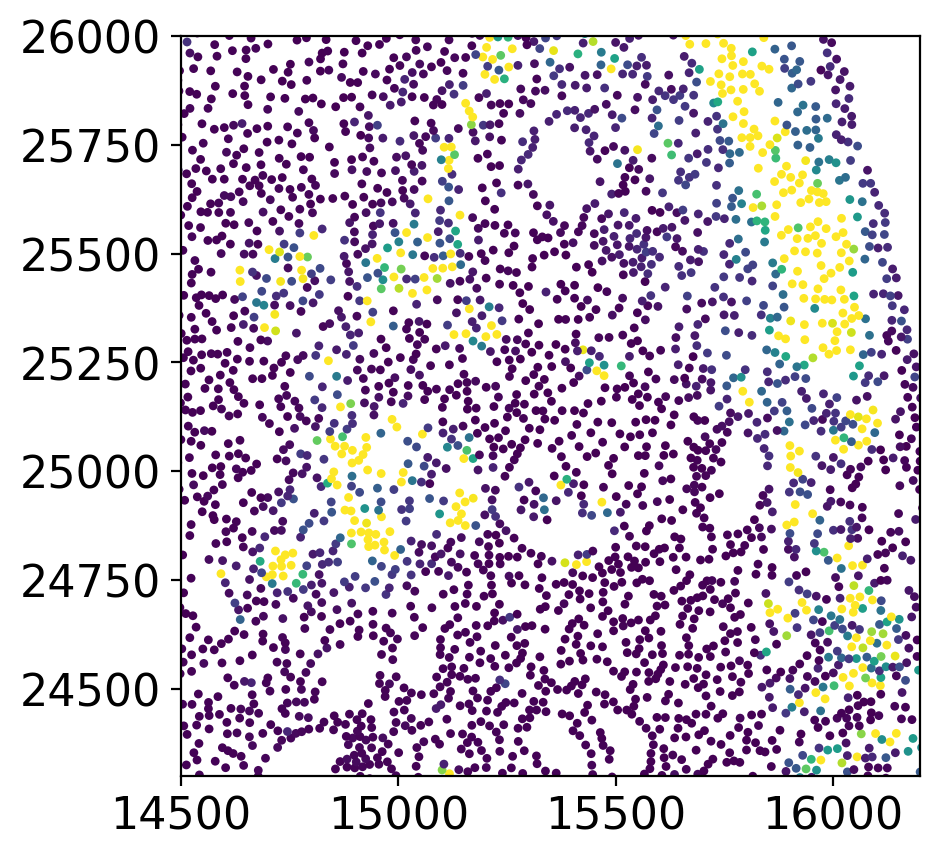

In [ ]:
plt.scatter(df_sub['centroid_col'], df_sub['centroid_row'], c = df_sub['HMGA2_nucleus_mean_intensity'], s = 10, edgecolor='none', vmax = 1000)
plt.gca().set_aspect('equal', adjustable='box')
plt.xlim([14500,16200])
plt.ylim([24300,26000])


In [ ]:
x_slice = slice(14500,16200)
y_slice = slice(24300,26000)
HMGA2 = rolling_ball_filter(get_image_slice(sdata, "celldive", "scale1", "HMGA2", y_slice, x_slice).astype(np.float32), 10)
uPAR = rolling_ball_filter(get_image_slice(sdata, "celldive", "scale1", "uPAR", y_slice, x_slice).astype(np.float32), 5)
DAPI = rolling_ball_filter(get_image_slice(sdata, "celldive", "scale1", "DAPI", y_slice, x_slice).astype(np.float32), 10)
GFP = get_image_slice(sdata, "celldive", "scale1", "PanCK", y_slice, x_slice).astype(np.float32)
ARG1 = rolling_ball_filter(get_image_slice(sdata, "celldive", "scale1", "Arg1", y_slice, x_slice).astype(np.float32), 10)
TNC = rolling_ball_filter(get_image_slice(sdata, "celldive", "scale1", "TNC", y_slice, x_slice).astype(np.float32), 5)


/tmp/ipykernel_963378/2567416677.py:48: RuntimeWarning: invalid value encountered in sqrt
  structure = 2 * np.sqrt(1 - ((mesh / radius.reshape(-1, *((1,) * ndim)))**2).sum(0))


In [ ]:
HMGA2_rgb = im2rgb(HMGA2, [1,1,0])
uPAR_rgb = im2rgb(uPAR, [1,0,1], quantile_high=0.98)
DAPI_rgb = im2rgb(DAPI, [0,0,1])
GFP_rgb = im2rgb(GFP, [1,0,0], quantile_low=0.01)
ARG1_rgb = im2rgb(ARG1, [0,1,0], quantile_high=0.99)
ARG1_rgb2 = im2rgb(ARG1, [0,1,0], quantile_high=0.95)
TNC_rgb = im2rgb(TNC, [0,1,1])


In [ ]:
from tifffile import tiffcomment
import xmltodict
filename = 'rawdata/SLIDE-0289_Final/SLIDE-0289_1.0.1_R001_DAPI_AF_F.ome.tif'
ome_xml = tiffcomment(filename)
my_dict = xmltodict.parse(ome_xml)
pixel_size = float(my_dict['OME']['Image']['Pixels']['@PhysicalSizeX'])
pixel_size

0.325002437518281

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..3.0].


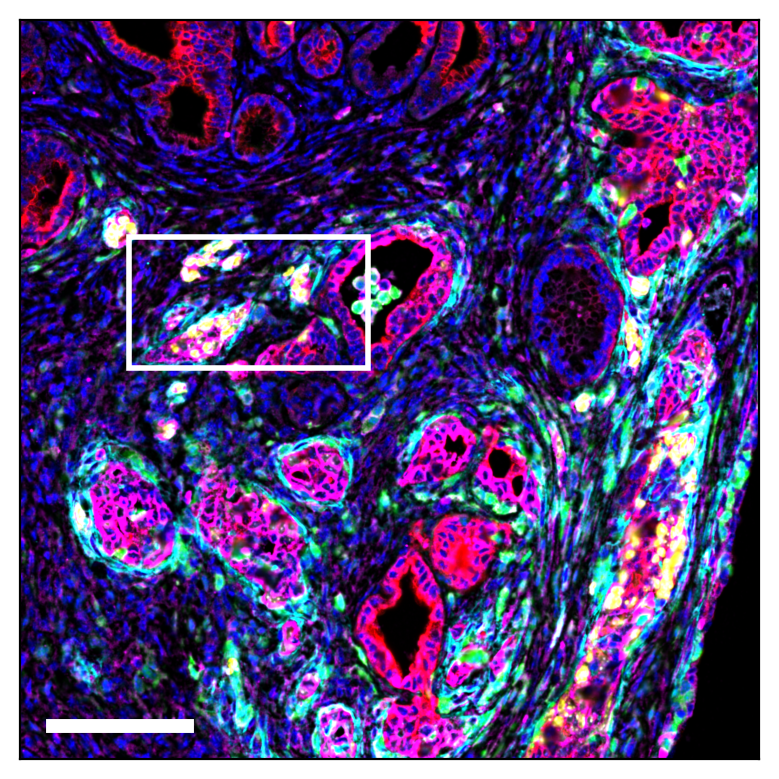

In [ ]:
plt.imshow(HMGA2_rgb + uPAR_rgb + DAPI_rgb + GFP_rgb + ARG1_rgb + TNC_rgb)
plt.gca().set_aspect('equal', adjustable='box')
current_xlim = plt.gca().get_xlim()
current_ylim = plt.gca().get_ylim()
plt.plot([current_xlim[0] + 25 / pixel_size, current_xlim[0] + (25 + 100) / pixel_size], [current_ylim[0] - 25 / pixel_size]*2, c = "w", linewidth = 5)
plt.xticks([])
plt.yticks([])

col_slice = slice(500,800)
row_slice = slice(250,800)
my_rect = Rectangle([row_slice.start, col_slice.start], row_slice.stop - row_slice.start, col_slice.stop - col_slice.start, facecolor='None', edgecolor='w', linewidth = 2)
plt.gca().add_patch(my_rect)

In [ ]:
DAPI_sub = DAPI_rgb[col_slice, row_slice,:]
TNC_sub = TNC_rgb[col_slice, row_slice,:]
HMGA2_sub = HMGA2_rgb[col_slice, row_slice,:]
uPAR_sub = uPAR_rgb[col_slice, row_slice,:]
ARG1_sub = ARG1_rgb2[col_slice, row_slice,:]
GFP_sub = GFP_rgb[col_slice, row_slice,:]

([], [])

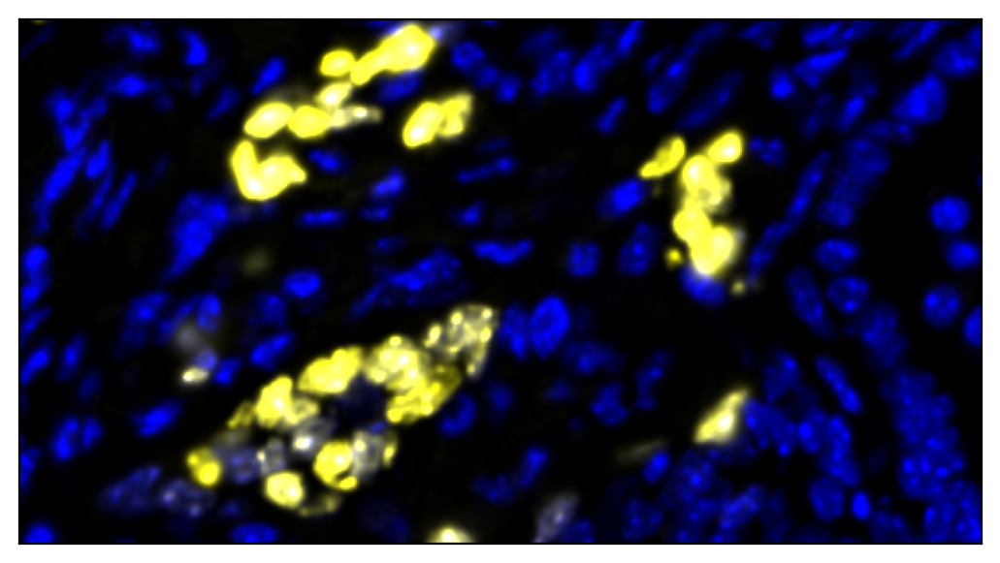

In [ ]:
plt.imshow(HMGA2_sub + DAPI_sub)
plt.gca().set_aspect('equal', adjustable='box')
current_xlim = plt.gca().get_xlim()
current_ylim = plt.gca().get_ylim()
plt.xticks([])
plt.yticks([])


([], [])

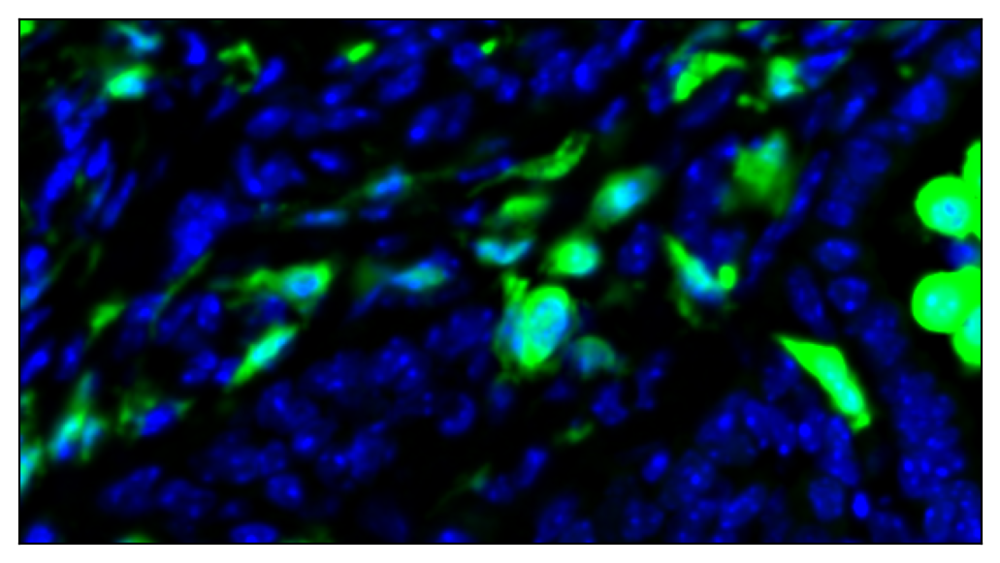

In [ ]:
plt.imshow(ARG1_sub + DAPI_sub)
plt.gca().set_aspect('equal', adjustable='box')
current_xlim = plt.gca().get_xlim()
current_ylim = plt.gca().get_ylim()
plt.xticks([])
plt.yticks([])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..2.0].


([], [])

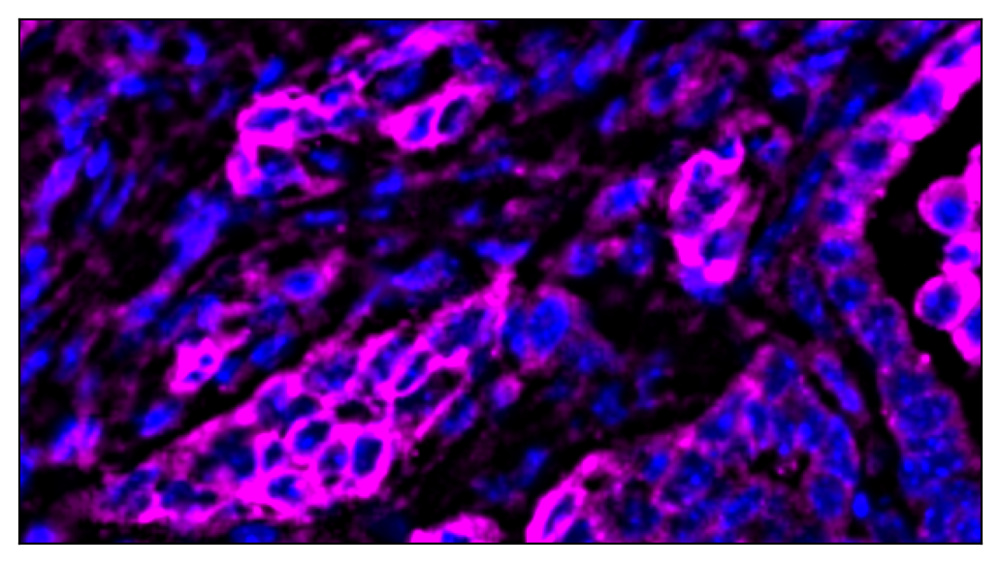

In [ ]:
plt.imshow(uPAR_sub + DAPI_sub)
plt.gca().set_aspect('equal', adjustable='box')
current_xlim = plt.gca().get_xlim()
current_ylim = plt.gca().get_ylim()
plt.xticks([])
plt.yticks([])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..2.0].


([], [])

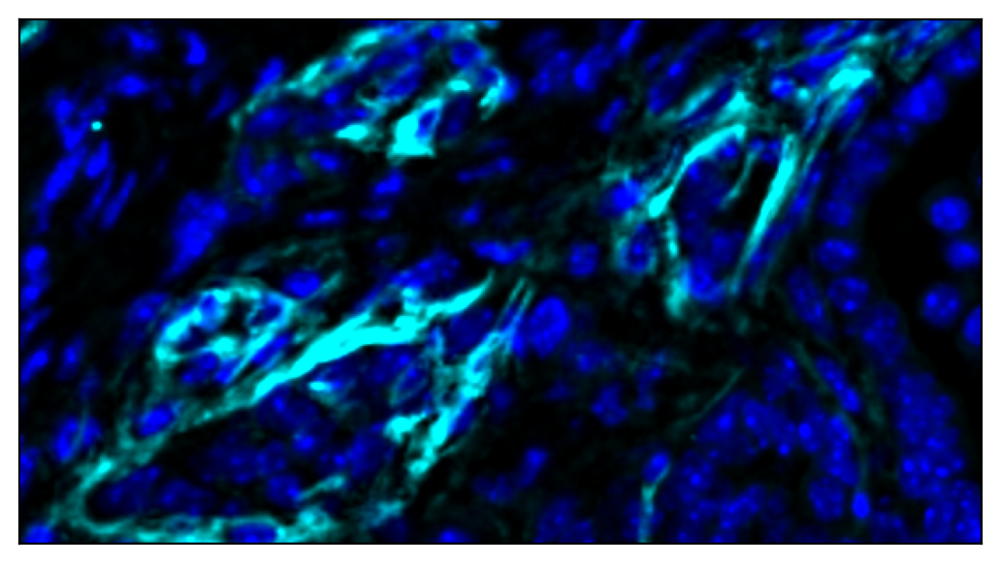

In [ ]:
plt.imshow(TNC_sub + DAPI_sub)
plt.gca().set_aspect('equal', adjustable='box')
current_xlim = plt.gca().get_xlim()
current_ylim = plt.gca().get_ylim()
plt.xticks([])
plt.yticks([])

In [ ]:
df = pd.read_csv("CellDive_progenitor_niche__cancer_annotated.csv.gz")

In [ ]:
selected_slide = 'SLIDE-0293'
df_sub = df.loc[df['slide_id'] == selected_slide,:].copy()

In [ ]:
sdata = sd.read_zarr(os.path.join("sdata", selected_slide))

version mismatch: detected: RasterFormatV02, requested: FormatV04
/data1/lowes/reyesj3/miniconda3/envs/sopa/lib/python3.12/site-packages/zarr/creation.py:610: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)
/data1/lowes/reyesj3/miniconda3/envs/sopa/lib/python3.12/site-packages/zarr/creation.py:610: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)
/data1/lowes/reyesj3/miniconda3/envs/sopa/lib/python3.12/site-packages/zarr/creation.py:610: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)
/data1/lowes/reyesj3/miniconda3/envs/sopa/lib/python3.12/site-packages/zarr/creation.py:610: UserWarning: ignoring keyword argument 'read_only'
  compressor, fill_value = _kwargs_compat(compressor, fill_value, kwargs)
/data1/lowes/reyesj3/miniconda3/envs/sopa/lib/python3.12/site-

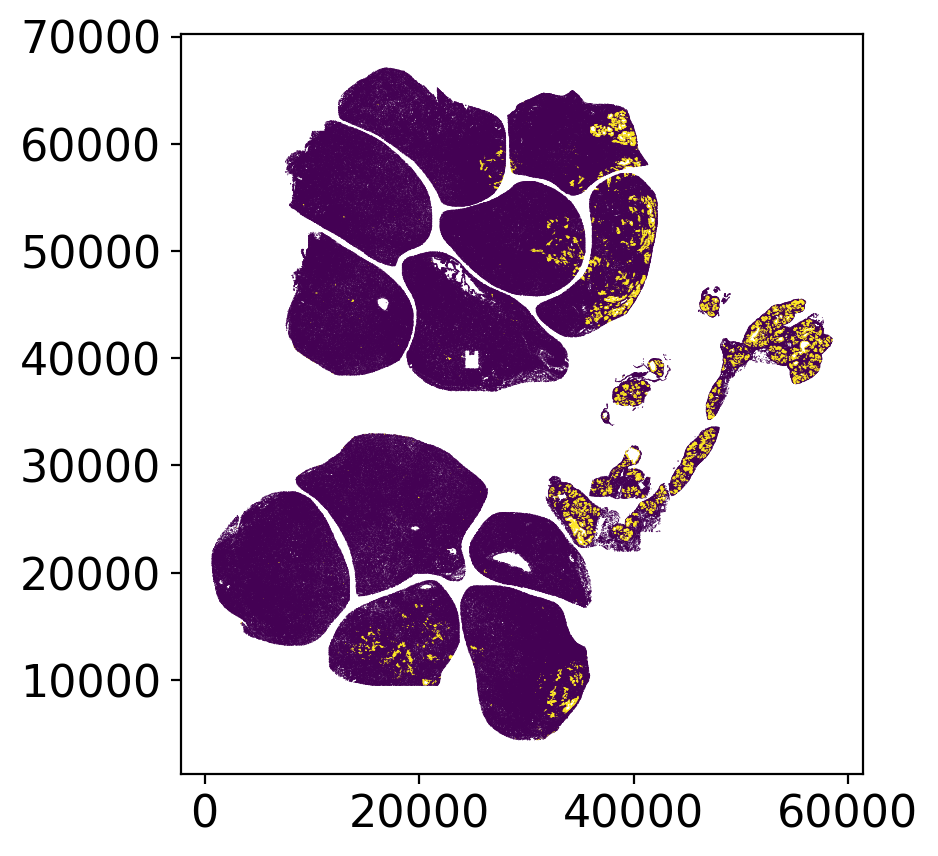

In [ ]:
plt.scatter(df_sub['centroid_col'], df_sub['centroid_row'], c = df_sub['GFP_positive'], s = 0.1, edgecolor='none')
plt.gca().set_aspect('equal', adjustable='box')


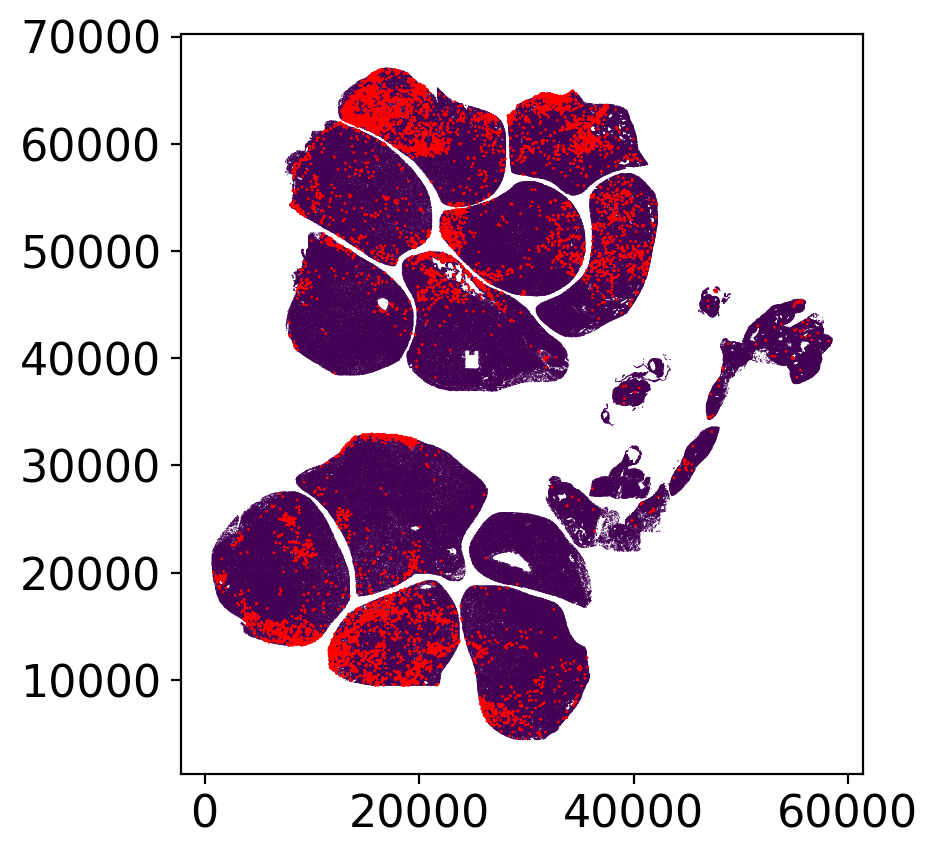

In [ ]:
plt.scatter(df_sub['centroid_col'], df_sub['centroid_row'], c = df_sub['HMGA2_positive'], s = 0.1, edgecolor='none')
plt.scatter(df_sub['centroid_col'][df_sub['HMGA2_positive']], df_sub['centroid_row'][df_sub['HMGA2_positive']], c = 'red', s = 1, edgecolor='none')
plt.gca().set_aspect('equal', adjustable='box')


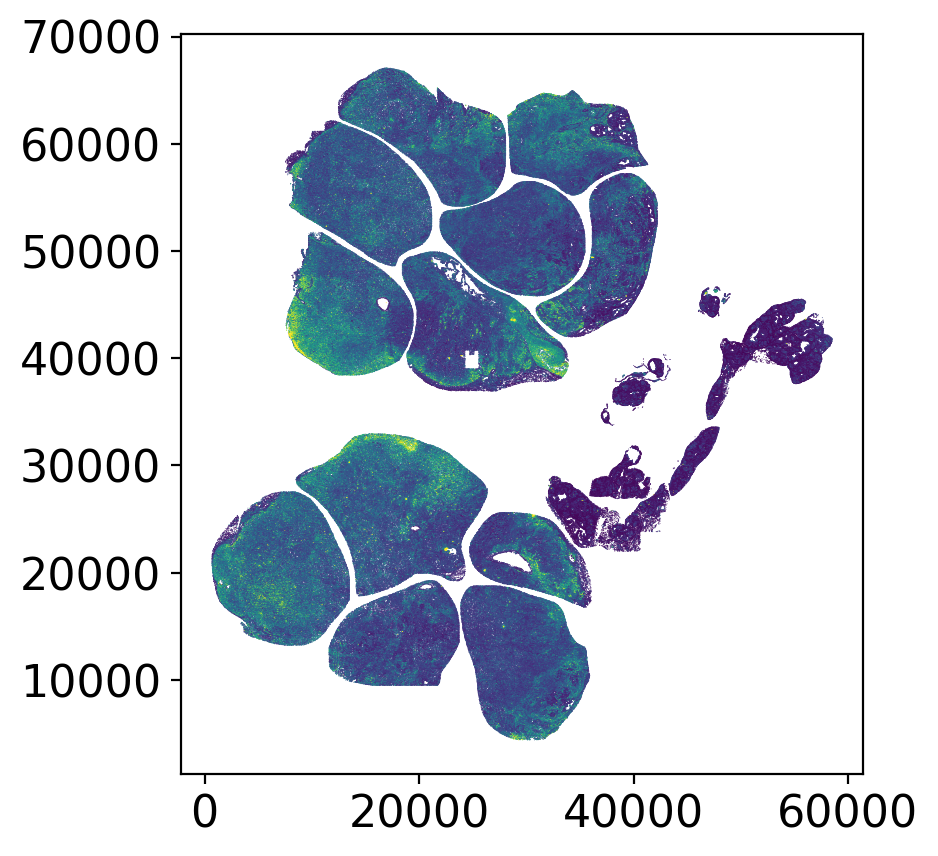

In [ ]:
plt.scatter(df_sub['centroid_col'], df_sub['centroid_row'], c = df_sub['uPAR_cyto_mean_intensity'], s = 0.1, edgecolor='none', vmax = 10000)
plt.gca().set_aspect('equal', adjustable='box')


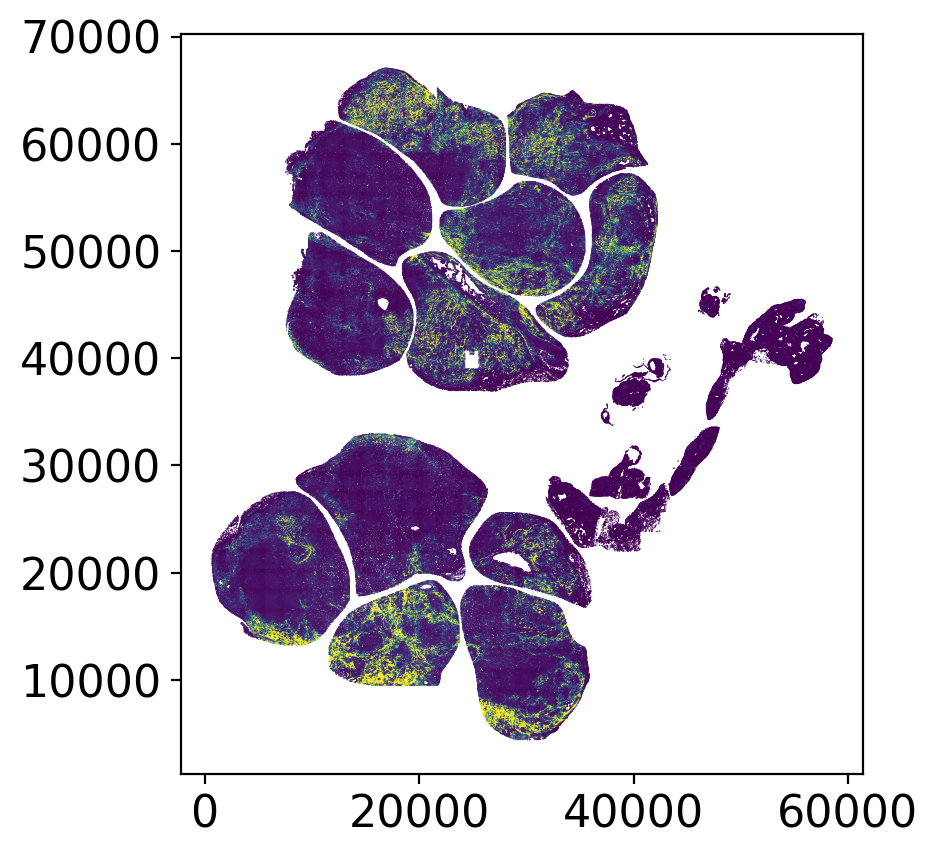

In [ ]:
plt.scatter(df_sub['centroid_col'], df_sub['centroid_row'], c = df_sub['TNC_cyto_mean_intensity'], s = 0.1, edgecolor='none', vmax = 10000)
plt.gca().set_aspect('equal', adjustable='box')


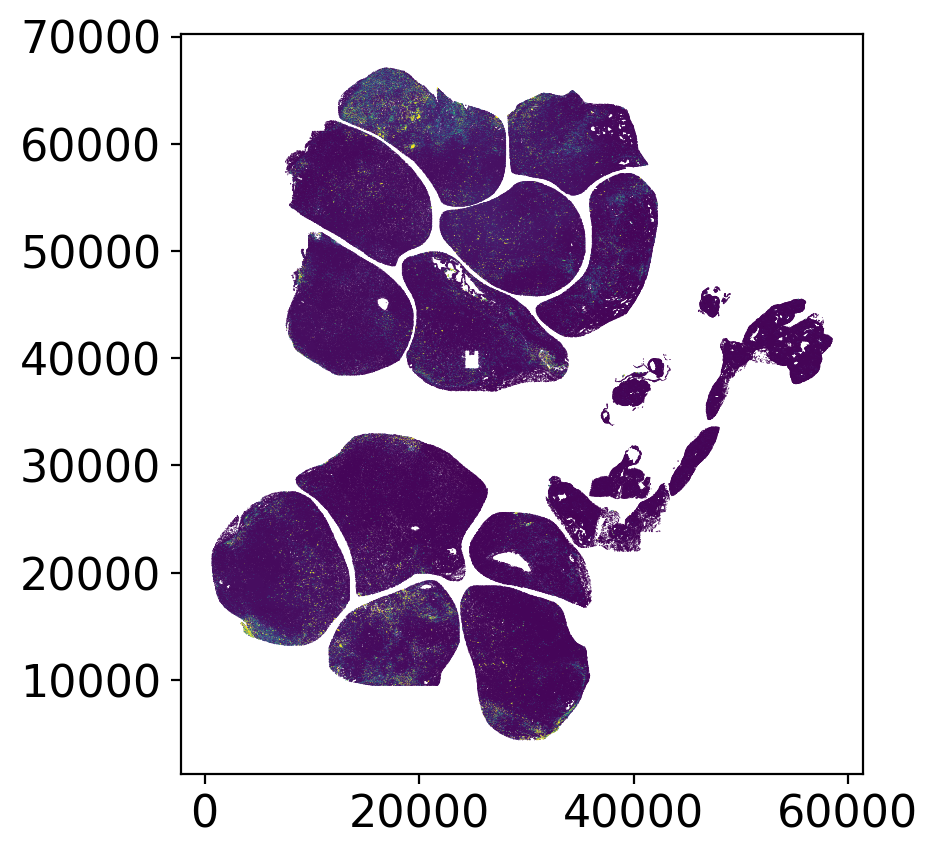

In [ ]:
plt.scatter(df_sub['centroid_col'], df_sub['centroid_row'], c = df_sub['Arg1_cyto_mean_intensity'], s = 0.1, edgecolor='none', vmax = 10000)
plt.gca().set_aspect('equal', adjustable='box')


/tmp/ipykernel_963378/2567416677.py:48: RuntimeWarning: invalid value encountered in sqrt
  structure = 2 * np.sqrt(1 - ((mesh / radius.reshape(-1, *((1,) * ndim)))**2).sum(0))
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..2.5560598373413086].


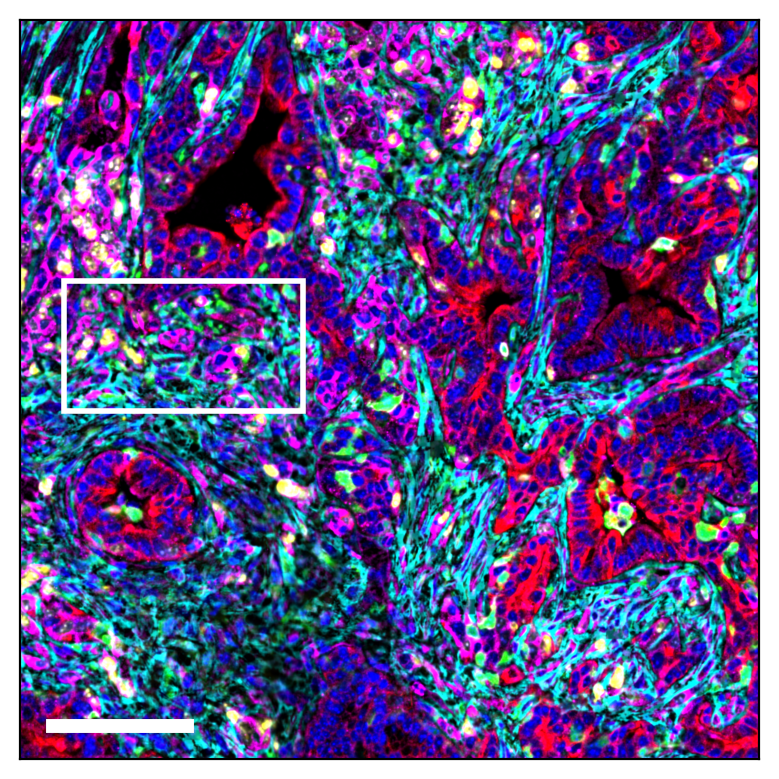

In [ ]:
y_slice = slice(9000,10700)
x_slice = slice(16000,17700)
HMGA2 = rolling_ball_filter(get_image_slice(sdata, "celldive", "scale1", "HMGA2", y_slice, x_slice).astype(np.float32), 10)
uPAR = rolling_ball_filter(get_image_slice(sdata, "celldive", "scale1", "uPAR", y_slice, x_slice).astype(np.float32), 5)
DAPI = rolling_ball_filter(get_image_slice(sdata, "celldive", "scale1", "DAPI", y_slice, x_slice).astype(np.float32), 10)
GFP = get_image_slice(sdata, "celldive", "scale1", "PanCK", y_slice, x_slice).astype(np.float32)
ARG1 = rolling_ball_filter(get_image_slice(sdata, "celldive", "scale1", "Arg1", y_slice, x_slice).astype(np.float32), 10)
TNC = rolling_ball_filter(get_image_slice(sdata, "celldive", "scale1", "TNC", y_slice, x_slice).astype(np.float32), 5)

HMGA2_rgb = im2rgb(HMGA2, [1,1,0])
uPAR_rgb = im2rgb(uPAR, [1,0,1], quantile_high=0.98)
DAPI_rgb = im2rgb(DAPI, [0,0,1])
GFP_rgb = im2rgb(GFP, [1,0,0], quantile_high=0.99)
ARG1_rgb = im2rgb(ARG1, [0,1,0], quantile_high=0.99)
ARG1_rgb2 = im2rgb(ARG1, [0,1,0], quantile_high=0.95)
TNC_rgb = im2rgb(TNC, [0,1,1])

plt.imshow(HMGA2_rgb + uPAR_rgb + DAPI_rgb + GFP_rgb + ARG1_rgb + TNC_rgb)
plt.gca().set_aspect('equal', adjustable='box')
current_xlim = plt.gca().get_xlim()
current_ylim = plt.gca().get_ylim()
plt.plot([current_xlim[0] + 25 / pixel_size, current_xlim[0] + (25 + 100) / pixel_size], [current_ylim[0] - 25 / pixel_size]*2, c = "w", linewidth = 5)
plt.xticks([])
plt.yticks([])

col_slice = slice(600,900)
row_slice = slice(100,650)
my_rect = Rectangle([row_slice.start, col_slice.start], row_slice.stop - row_slice.start, col_slice.stop - col_slice.start, facecolor='None', edgecolor='w', linewidth = 2)
plt.gca().add_patch(my_rect)

In [ ]:
DAPI_sub = DAPI_rgb[col_slice, row_slice,:]
TNC_sub = TNC_rgb[col_slice, row_slice,:]
HMGA2_sub = HMGA2_rgb[col_slice, row_slice,:]
uPAR_sub = uPAR_rgb[col_slice, row_slice,:]
ARG1_sub = ARG1_rgb2[col_slice, row_slice,:]
GFP_sub = GFP_rgb[col_slice, row_slice,:]

([], [])

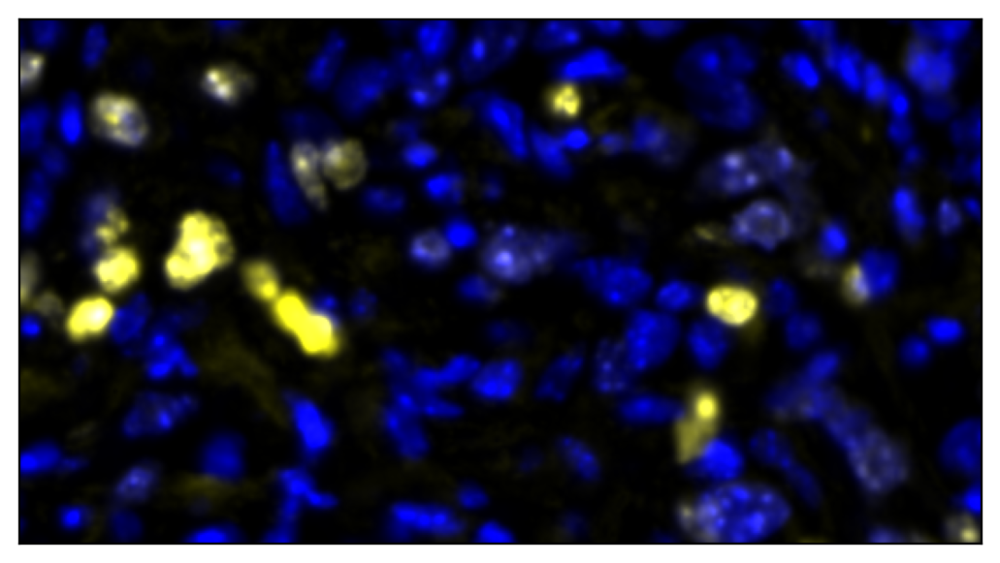

In [ ]:
plt.imshow(HMGA2_sub + DAPI_sub)
plt.gca().set_aspect('equal', adjustable='box')
current_xlim = plt.gca().get_xlim()
current_ylim = plt.gca().get_ylim()
plt.xticks([])
plt.yticks([])


([], [])

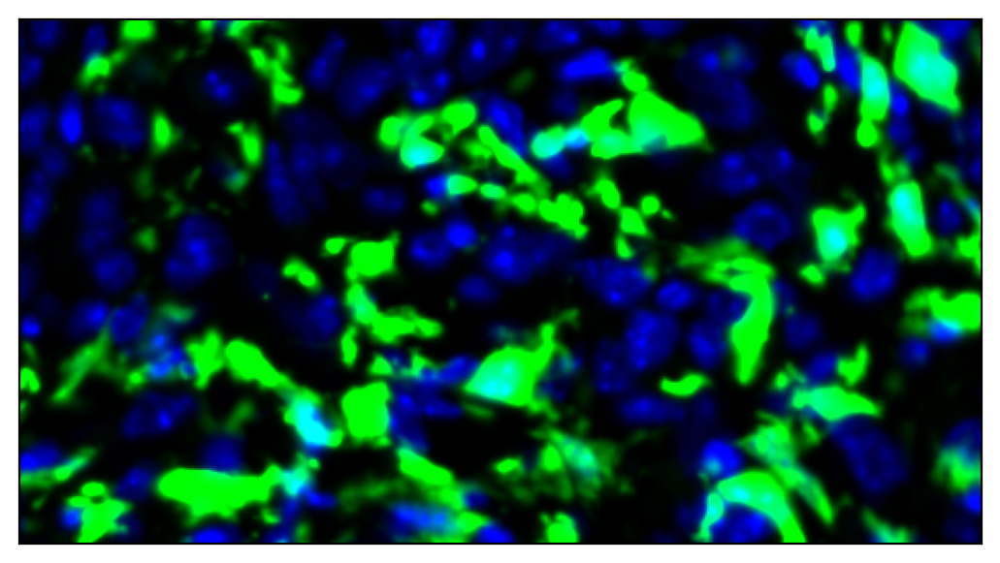

In [ ]:
plt.imshow(ARG1_sub + DAPI_sub)
plt.gca().set_aspect('equal', adjustable='box')
current_xlim = plt.gca().get_xlim()
current_ylim = plt.gca().get_ylim()
plt.xticks([])
plt.yticks([])

([], [])

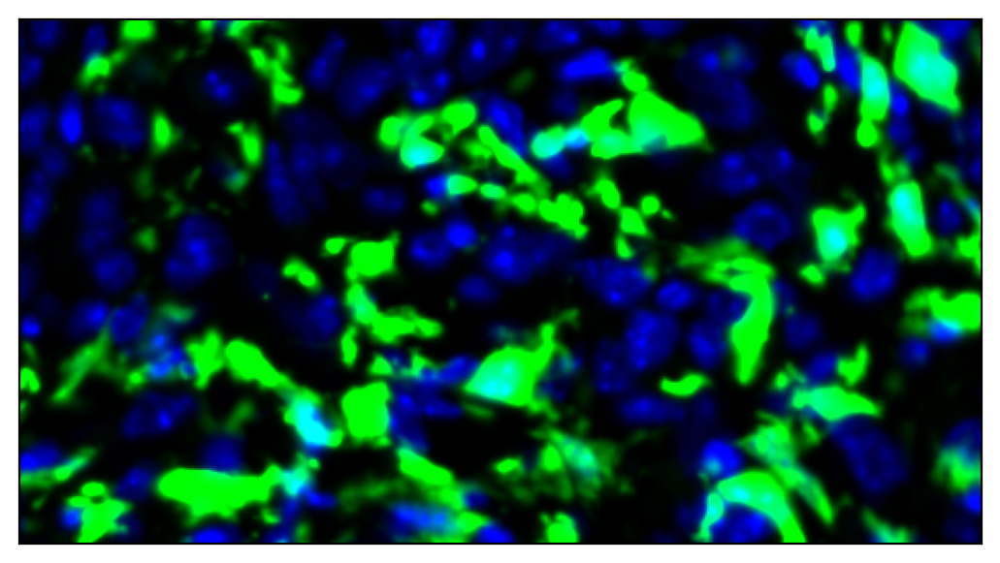

In [ ]:
plt.imshow(ARG1_sub + DAPI_sub)
plt.gca().set_aspect('equal', adjustable='box')
current_xlim = plt.gca().get_xlim()
current_ylim = plt.gca().get_ylim()
plt.xticks([])
plt.yticks([])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.9898709654808044].


([], [])

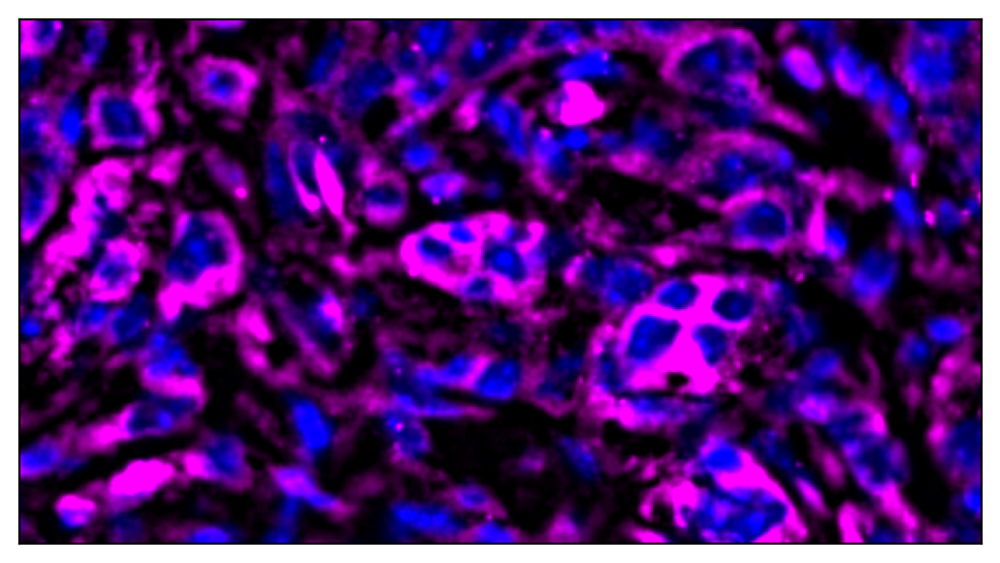

In [ ]:
plt.imshow(uPAR_sub + DAPI_sub)
plt.gca().set_aspect('equal', adjustable='box')
current_xlim = plt.gca().get_xlim()
current_ylim = plt.gca().get_ylim()
plt.xticks([])
plt.yticks([])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..1.8701415657997131].


([], [])

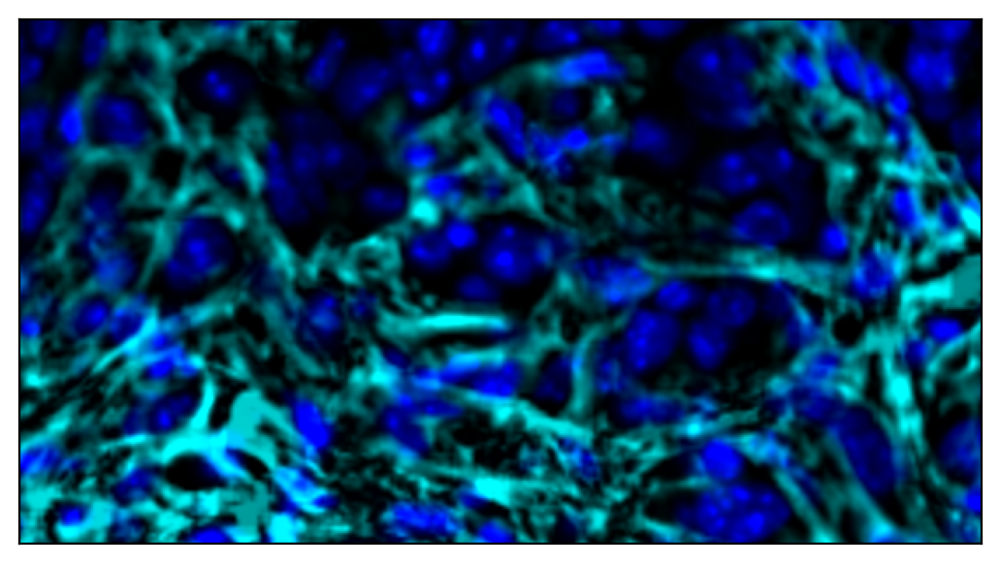

In [ ]:
plt.imshow(TNC_sub + DAPI_sub)
plt.gca().set_aspect('equal', adjustable='box')
current_xlim = plt.gca().get_xlim()
current_ylim = plt.gca().get_ylim()
plt.xticks([])
plt.yticks([])